<h1><center>Bayesian Hierarchical Models</center></h1>

## Introduction
This project explores the application of Bayesian hierarchical models to analyze math scores across different schools in the U.S. By leveraging hierarchical modeling, we aim to estimate both global and school-specific effects, which is particularly useful when data from some schools is limited.

## Motivation
Given a dataset where:
- $Y_{i,j}$ represents the score of student $i$ in school $j$
- $x_{i,j}$ denotes the covariates of student $i$ in school $j$
- $m$ is the total number of schools, and $n_j$ is the number of students in school $j$

The goal is to estimate the global and school-specific effects, identifying which schools yield better performance despite the variability in sample sizes across schools. 

## Bayesian Hierarchical Models

Bayesian hierarchical models are a powerful statistical approach for analyzing data with multi-level or nested structures. These models allow for the inclusion of variability at different levels, such as individual, group, or population, by treating parameters as random variables with their own probability distributions. 

The Bayesian framework enables the integration of prior knowledge with observed data, allowing for the "borrowing of strength" across different groups or levels. This results in more robust and accurate estimates, particularly when data is sparse or imbalanced across groups. 

In the following notebook I am going to implement two different Bayesian Hierarchical Models:
1) **Hierarchical Normal Model without Covariates**

   Hierarchical models without covariates analyze data with a multi-level structure, accounting for variability within and between groups without using additional predictors. They allow each group to have its own parameters while borrowing information from an overall distribution, leading to more accurate estimates, especially when group data is limited.
3) **Hierarchical Normal Model with Covariates**
   
   Hierarchical models with covariates analyze multi-level data while incorporating predictor variables. These models account for variability within and between groups, allowing covariates to explain differences across levels. This approach provides more detailed insights by capturing the relationship between predictors and outcomes, improving the accuracy of estimates across groups.

## Parameter Estimation - Gibbs Sampling
The model parameters are estimated via Gibbs Sampling. Gibbs sampling is a robust Markov Chain Monte Carlo (MCMC) technique used to approximate complex multi-dimensional probability distributions and it is especially valuable in Bayesian settings where direct computation of the posterior distribution is challenging.  

#### Key Features of Gibbs Sampling:

- **Initialization**: Begin by assigning arbitrary values to the unknown model parameters.
  
- **Iterative Updating**: Sequentially update each parameter by sampling from its respective full conditional distribution.
  
- **Cyclic Process**: Repeat the updating process for each variable in a cyclic manner until convergence is achieved.

#### Advantages of Gibbs Sampling:

1. **Simplified Sampling Process**: Sampling from univariate full conditional distributions is more manageable than deriving the entire posterior distribution.
   
2. **Convergence to Equilibrium**: After a sufficient number of iterations, the algorithm reaches a state of equilibrium where the generated samples closely follow the target distribution.

### Gibbs Sampling in a Bayesian Framework
Let $y$ denote observations generated from the sampling distribution $f(y|\theta)$ and $\pi(\theta)$ be a prior supported on the parameter space $\Theta$. Then one of the central goals of the Bayesian statistics is to approximate the posterior density
$$
\pi(\theta | y) = \frac{f(y|\theta) \cdot \pi(\theta)}{\int_{\Theta} f(y|\theta) \cdot \pi(\theta) d\theta}
$$

To explain the Gibbs sampler, we additionally assume that the parameter space $\Theta$ is decomposed as
$$
\Theta = \prod_{i=1}^{K} \Theta_i = \Theta_1 \times \cdots \times \Theta_i \times \cdots \times \Theta_K, \quad (K > 1),
$$
where $\times$ represents the Cartesian product. Each component parameter space $\Theta_i$ can be a set of scalar components, subvectors, or matrices. Define a set $\Theta_{-i}$ that complements the $\Theta_i$. 

The essential ingredients of the Gibbs sampler is the $i$-th full conditional posterior distribution for each $i = 1, \cdots, K$
$$
\pi(\theta_i | \theta_{-i}, y) = \pi(\theta_i | \theta_1, \cdots, \theta_{i-1}, \theta_{i+1}, \cdots, \theta_K, y).
$$

In a Gibbs sampling scheme, each component of $\theta$ is updated by drawing a value from the corresponding full conditional distribution. That is
$$
\theta_i^* \sim \pi(\theta_i | \theta_{-i}^t, x) \quad \text{for} \ i = 1, \ldots, K
$$
Once the cycle is completed, we then set $\theta^{t+1} = \theta^*$ and the Markov Chain generated by the Gibbs sampler has the target $\pi(\theta | y)$ as its stationary distribution.


The following algorithm details a generic Gibbs sampler:



<div align="center">
    <img src="Images/Generic_Gibbs_Sampler.png" alt="title" width="600" />
</div>

#### Importing Modules

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from pylab import rcParams
from tqdm import tqdm

import statistics as stat
import random
from scipy.stats import norm, wishart, gamma

from IPython.display import Image, display, Math

np.random.seed(1)

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)
HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#93D30C", "#8F00FF"]
sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 15, 15
rcParams.update({'axes.facecolor':'whitesmoke'})
tqdm.pandas()

#### Helper Functions

In [3]:
# Function 1
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

def hist_THETA(Beta_MCMC):
    theta_means = np.mean(Beta_MCMC, axis=0)
    fig = plt.figure(figsize=(26, 14))
    rows, columns = 3,3
    indices = list(range(5)) + list(range(96, 100))
    for idx, i in enumerate(indices):
        fig.add_subplot(rows, columns, idx + 1)
        plt.hist(Beta_MCMC[:,i], bins=30, color='silver', edgecolor='black',density = True) #last 5000 samples
        plt.axvline(x = theta_means[i], color = 'red', label = 'Posterior Mean',linewidth=3, linestyle = 'dashed')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        sns.kdeplot(Beta_MCMC[:,i], color = 'black')
        plt.legend()
        plt.title(r'$\theta_{%d}$' % (i+1), fontsize=19)
    plt.show()

# Function 2
def hist_SMT(Beta_MCMC):
    titles = [r'$ \sigma^2 $', r'$ \mu $', r'$ \tau^2 $']
    post_mean = np.mean(Beta_MCMC, axis=0)
    fig = plt.figure(figsize=(26, 4))
    rows,columns = 1,3
    for i in range(0,3): 
        fig.add_subplot(rows, columns, i+1)
        plt.hist(Beta_MCMC[:,i], bins=30, color='silver', edgecolor='black',density = True) #last 5000 samples
        plt.axvline(x = post_mean[i], color = 'red', label = 'Posterior Mean',linewidth=3, linestyle = 'dashed')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        sns.kdeplot(Beta_MCMC[:,i], color = 'black')
        plt.legend()
        plt.title(titles[i], fontsize=19)
    plt.show()

# Function 3
def trace_SMT(Beta_MCMC):
    fig = plt.figure(figsize=(25, 5))
    rows,columns = 1,3
    titles = [r'$ \sigma^2 $', r'$ \mu $', r'$ \tau^2 $']
    for i in range(0,3): 
        fig.add_subplot(rows, columns, i+1)
        plt.plot(Beta_MCMC[:,i], color = 'gray')
    
        cumulative_sum = np.cumsum(Beta_MCMC[:, i])
        line_values = cumulative_sum / np.arange(1, len(Beta_MCMC) + 1)
        plt.plot(line_values, color="goldenrod", linewidth=2)
        #plt.title(r'$ \Theta_i $')
        plt.title(titles[i], fontsize=19)
    plt.show()

# Function 4
def trace_THETA(Beta_MCMC):
    fig = plt.figure(figsize=(25, 15))
    rows, columns = 3, 3
    
    # Combine the two ranges into one list
    indices = list(range(5)) + list(range(96, 100))
    
    for idx, i in enumerate(indices):
        fig.add_subplot(rows, columns, idx + 1)
        plt.plot(Beta_MCMC[:, i], color='gray')
        
        # Calculate and plot the cumulative mean line
        cumulative_sum = np.cumsum(Beta_MCMC[:, i])
        line_values = cumulative_sum / np.arange(1, len(Beta_MCMC) + 1)
        plt.plot(line_values, color="goldenrod", linewidth=2)
        
        plt.title(r'$\theta_{%d}$' % (i + 1), fontsize=19)
    
    plt.tight_layout()
    plt.show()

# Function 5
def trace_box_THETA(Beta_MCMC, n_batches=20):
    fig = plt.figure(figsize=(25, 15))
    rows, columns = 3, 3
    batch_size = len(Beta_MCMC) / n_batches
    # Combine the two ranges into one list
    indices = list(range(5)) + list(range(96, 100))
    
    for idx, i in enumerate(indices):
        fig.add_subplot(rows, columns, idx + 1)
        
        # Create batch labels for the x-axis
        batch_labels = np.repeat(np.arange(n_batches), batch_size)
        
        # Use Seaborn's boxplot for visualization
        sns.boxplot(x=batch_labels[:len(Beta_MCMC)], y=Beta_MCMC[:, i], color="gray", width=0.7)
        
        
        # Adjust the title with LaTeX formatting
        plt.title(r'$\theta_{%d}$' % (i+1), fontsize=19)
    
    plt.tight_layout()
    plt.show()

# Function 6
def trace_box_SMT(Beta_MCMC, n_batches=20):
    titles = [r'$ \sigma^2 $', r'$ \mu $', r'$ \tau^2 $']
    fig = plt.figure(figsize=(25, 6))
    rows, columns = 3, 3
    batch_size = len(Beta_MCMC) / n_batches
    # Combine the two ranges into one list
    rows,columns = 1,3
    for i in range(0,3):
        fig.add_subplot(rows, columns, i+1)
        
        # Create batch labels for the x-axis
        batch_labels = np.repeat(np.arange(n_batches), batch_size)
        
        # Use Seaborn's boxplot for visualization
        sns.boxplot(x=batch_labels[:len(Beta_MCMC)], y=Beta_MCMC[:, i], color="gray", width=0.7)
        
        
        # Adjust the title with LaTeX formatting
        plt.title(titles[i], fontsize=19)
    
    plt.tight_layout()
    plt.show()



# Function 7
def autocorr_THETA(Beta_MCMC):
    fig = plt.figure(figsize=(25, 20))
    rows,columns = 3,3
    indices = list(range(5)) + list(range(96, 100))
    for idx, i in enumerate(indices):
        fig.add_subplot(rows, columns, idx + 1)
        pd.plotting.autocorrelation_plot(Beta_MCMC[:, i-1], color = 'gray')
        plt.ylim(-0.04,0.04)
        plt.grid(axis = 'y')
        plt.title(r'$\theta_{%d}$' % (i + 1), fontsize=19)
    plt.show()

#Function 8
def autocorr_SMT(Beta_MCMC):
    titles = [r'$ \sigma^2 $', r'$ \mu $', r'$ \tau^2 $']
    fig = plt.figure(figsize=(26, 6))
    rows,columns = 1,3
    for i in range(0,3): 
        fig.add_subplot(rows, columns, i+1)
        pd.plotting.autocorrelation_plot(Beta_MCMC[:, i], color = 'gray')
        plt.ylim(-0.04,0.04)
        plt.grid(axis = 'y')
        plt.title(titles[i], fontsize=19)
    plt.show()

# Function 9
def print_probit(Beta_Probit, cf = 'theta'):
    print(f"   School       {cf}")
    print("----------------------------")

    for i in range(5):
        print(f"School {str(i+1) + ' '}    |   {round(Beta_Probit[i],4)}")
    print("...          |   ...")
    for i in range(96,99):
        print(f"School {str(i+1)  }    |   {round(Beta_Probit[i],4)}")
    print(f"School {str(100) }   |   {round(Beta_Probit[99],4)}")
    print("----------------------------")

In [4]:
# Function 2
def hist_THETA_II(Beta_MCMC):
    titles = [r'$ \theta_1 $', r'$ \theta_2 $', r'$ \theta_3 $']
    post_mean = np.mean(Beta_MCMC, axis=0)
    fig = plt.figure(figsize=(26, 4))
    rows,columns = 1,3
    for i in range(0,3): 
        fig.add_subplot(rows, columns, i+1)
        plt.hist(Beta_MCMC[:,i], bins=30, color='silver', edgecolor='black',density = True) #last 5000 samples
        plt.axvline(x = post_mean[i], color = 'red', label = 'Posterior Mean',linewidth=3, linestyle = 'dashed')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        sns.kdeplot(Beta_MCMC[:,i], color = 'black')
        plt.legend()
        plt.title(titles[i], fontsize=19)
    plt.show()

# Function 3
def trace_THETA_II(Beta_MCMC):
    fig = plt.figure(figsize=(25, 5))
    rows,columns = 1,3
    titles = [r'$ \theta_1 $', r'$ \theta_2 $', r'$ \theta_3 $']
    for i in range(0,3): 
        fig.add_subplot(rows, columns, i+1)
        plt.plot(Beta_MCMC[:,i], color = 'gray')
    
        cumulative_sum = np.cumsum(Beta_MCMC[:, i])
        line_values = cumulative_sum / np.arange(1, len(Beta_MCMC) + 1)
        plt.plot(line_values, color="goldenrod", linewidth=2)
        #plt.title(r'$ \Theta_i $')
        plt.title(titles[i], fontsize=19)
    plt.show()

#Function 8
def autocorr_THETA_II(Beta_MCMC):
    titles = [r'$ \theta_1 $', r'$ \theta_2 $', r'$ \theta_3 $']
    fig = plt.figure(figsize=(26, 6))
    rows,columns = 1,3
    for i in range(0,3): 
        fig.add_subplot(rows, columns, i+1)
        pd.plotting.autocorrelation_plot(Beta_MCMC[:, i], color = 'gray')
        plt.ylim(-0.04,0.04)
        plt.grid(axis = 'y')
        plt.title(titles[i], fontsize=19)
    plt.show()

# Function 6
def trace_box_THETA_II(Beta_MCMC, n_batches=20):
    titles = [r'$ \theta_1 $', r'$ \theta_2 $', r'$ \theta_3 $']
    fig = plt.figure(figsize=(25, 6))
    rows, columns = 1, 3
    num_samples = len(Beta_MCMC)

    # Split indices into batches
    batch_indices = np.array_split(np.arange(num_samples), n_batches)
    batch_labels = np.empty(num_samples, dtype=int)
    for idx, batch in enumerate(batch_indices):
        batch_labels[batch] = idx

    for i in range(3):
        fig.add_subplot(rows, columns, i+1)
        sns.boxplot(x=batch_labels, y=Beta_MCMC[:, i], color="gray", width=0.7)
        plt.title(titles[i], fontsize=19)
    plt.tight_layout()
    plt.show()

# Function 2
def hist_S2_b(s2):
    titles = [r'$ \sigma^2 $']
    post_mean = np.mean(s2, axis=0)
    fig = plt.figure(figsize=(25, 5))  # Match the figsize of hist_THETA_II
    rows, columns = 1, 3
    for i in range(1, 4):  # Subplot indices from 1 to 3
        ax = fig.add_subplot(rows, columns, i)
        if i == 1:
            # Plot the histogram in the first subplot
            ax.hist(s2, bins=30, color='silver', edgecolor='black', density=True)
            ax.axvline(x=post_mean, color='red', label='Posterior Mean', linewidth=3, linestyle='dashed')
            ax.grid(axis='y', linestyle='--', alpha=0.7)
            sns.kdeplot(s2, color='black', ax=ax)
            ax.legend()
            ax.set_title(titles[0], fontsize=19)
        else:
            # Leave the other subplots empty
            ax.axis('off')
    plt.tight_layout()
    plt.show()


def plot_S2_b(S2_b, n_batches=20):
    # Convert S2_b to a NumPy array if it's a list
    S2_b = np.array(S2_b)
    num_samples = len(S2_b)
    
    fig = plt.figure(figsize=(25, 6))
    rows, columns = 1, 3

    # Titles for the subplots
    titles = [r'$Autocorrelation\ of\ \sigma^2$', r'$Trace\ Plot\ of\ \sigma^2$', r'$Batch-wise\ Boxplot\ of\ \sigma^2$']

    # First subplot: Autocorrelation plot
    ax1 = fig.add_subplot(rows, columns, 1)
    pd.plotting.autocorrelation_plot(S2_b, ax=ax1, color='gray')
    ax1.set_title(titles[0], fontsize=19)
    ax1.grid(axis='y')

    # Second subplot: Trace plot with cumulative mean
    ax2 = fig.add_subplot(rows, columns, 2)
    ax2.plot(S2_b, color='gray', label='Trace')
    cumulative_mean = np.cumsum(S2_b) / np.arange(1, num_samples + 1)
    ax2.plot(cumulative_mean, color="goldenrod", linewidth=2, label='Cumulative Mean')
    ax2.set_title(titles[1], fontsize=19)
    ax2.legend()

    # Third subplot: Batch-wise boxplot
    ax3 = fig.add_subplot(rows, columns, 3)
    
    # Split data into batches and create batch labels
    batch_indices = np.array_split(np.arange(num_samples), n_batches)
    batch_labels = np.empty(num_samples, dtype=int)
    for idx, batch in enumerate(batch_indices):
        batch_labels[batch] = idx

    # Create a DataFrame for plotting
    df = pd.DataFrame({'Batch': batch_labels, 'S2_b': S2_b})
    sns.boxplot(x='Batch', y='S2_b', data=df, color='gray', width=0.7, ax=ax3)
    ax3.set_title(titles[2], fontsize=19)

    plt.tight_layout()
    plt.show()

def hist_BETA(beta_chains_dict):
    coeff = [*beta_chains_dict][0]
    Beta_MCMC = [*beta_chains_dict.values()][0]
    theta_means = np.mean(Beta_MCMC, axis=0)
    fig = plt.figure(figsize=(26, 14))
    rows, columns = 3,3
    for idx, i in enumerate(range(9)):
        fig.add_subplot(rows, columns, idx + 1)
        plt.hist(Beta_MCMC[:,i], bins=30, color='silver', edgecolor='black',density = True) #last 5000 samples
        plt.axvline(x = theta_means[i], color = 'red', label = 'Posterior Mean',linewidth=3, linestyle = 'dashed')
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        sns.kdeplot(Beta_MCMC[:,i], color = 'black')
        plt.legend()
        plt.title(r'$\beta_{%d}\ -\ School\ {%d}$' % (coeff, i + 1), fontsize=19)
    plt.show()


# Function 4
def trace_BETA(beta_chains_dict):
    coeff = [*beta_chains_dict][0]
    Beta_MCMC = [*beta_chains_dict.values()][0]
    fig = plt.figure(figsize=(25, 15))
    rows, columns = 3, 3
    
    for idx, i in enumerate(range(9)):
        fig.add_subplot(rows, columns, idx + 1)
        plt.plot(Beta_MCMC[:, i], color='gray')
        
        # Calculate and plot the cumulative mean line
        cumulative_sum = np.cumsum(Beta_MCMC[:, i])
        line_values = cumulative_sum / np.arange(1, len(Beta_MCMC) + 1)
        plt.plot(line_values, color="goldenrod", linewidth=2)
        
        plt.title(r'$\beta_{%d}\ -\ School\ {%d}$' % (coeff, i + 1), fontsize=19)
    
    plt.tight_layout()
    plt.show()

def trace_box_BETA(beta_chains_dict, n_batches=20):
    coeff = [*beta_chains_dict][0]
    Beta_MCMC = [*beta_chains_dict.values()][0]
    fig = plt.figure(figsize=(25, 15))
    rows, columns = 3, 3
    num_samples = len(Beta_MCMC)

    # Ensure that n_batches does not exceed the number of samples
    n_batches = min(n_batches, num_samples)

    # Split indices into batches
    batch_indices = np.array_split(np.arange(num_samples), n_batches)
    batch_labels = np.empty(num_samples, dtype=int)
    for idx, batch in enumerate(batch_indices):
        batch_labels[batch] = idx

    for idx, i in enumerate(range(9)):
        ax = fig.add_subplot(rows, columns, idx + 1)
        sns.boxplot(x=batch_labels, y=Beta_MCMC[:, i], color="gray", width=0.7, ax=ax)
        ax.set_title(r'$\beta_{%d}\ - School\ {%d}$' % (coeff, i+1), fontsize=19)
        ax.set_xlabel('Batch')
        ax.set_ylabel('Value')

    plt.tight_layout()
    plt.show()

# Function 7
def autocorr_BETA(beta_chains_dict):
    coeff = [*beta_chains_dict][0]
    Beta_MCMC = [*beta_chains_dict.values()][0]
    fig = plt.figure(figsize=(25, 20))
    rows,columns = 3,3
    
    for idx, i in enumerate(range(9)):
        fig.add_subplot(rows, columns, idx + 1)
        pd.plotting.autocorrelation_plot(Beta_MCMC[:, i-1], color = 'gray')
        plt.ylim(-0.04,0.04)
        plt.grid(axis = 'y')
        plt.title(r'$\beta_{%d}\ -\ School\ {%d}$' % (coeff, i + 1), fontsize=19)
    plt.show()

In [5]:
def get_beta_school(BETA_ps, coeff=0):
    try:
        if not (0 <= coeff < BETA_ps.shape[2]):
            raise Exception(f"ERROR : Invalid coefficient - Available coefficients are: {list(range(BETA_ps.shape[2]))}")
        display(Math(f"Chosen\\ Coefficient: \\beta_{coeff}"))
    except ValueError as e:
        print(e)
        return  # Stop execution here if there's an error
    
    beta_chains = []
    for j in range(9):
        beta_j = []
        for i in range(BETA_ps.shape[0]):
            beta_k_j = BETA_ps[i][j][coeff]
            beta_j.append(beta_k_j)
        beta_chains.append(beta_j)
    
    beta_chains = np.array(beta_chains).T
    return {coeff: beta_chains}

# Part I
### Gibbs Sampling for Hierarchical Normal Model without Covarites

### Hierarchical Model Structure
$$Y_{i,j} \mid \theta_j, \sigma^2 \sim N(\theta_j, \sigma^2), \quad i = 1, \ldots, m; \quad j = 1, \ldots, n_j$$
    
$$\theta_j \mid \mu, \tau^2 \sim N(\mu, \tau^2)$$

$$(\mu, \tau^2, \sigma^2) \sim p_0 $$

**Note**: 
- $Y_{i,j}|{\theta_i,\sigma^2}$ is the within-group model and $\theta_j|\mu, \tau^2$ is the between variability model.
- The within gorup sampling variability $\sigma^2$ is assumed to be constant across groups, this implies that  $\theta_j|\mu, \tau^2$ doesn't describe any heterogeneity in group-specific variances. \\
- The fixed and unknown parameters of these models are $\mu, \sigma^2, \tau^2$.

### Prior Distributions
As a choice of prior distributions for these parameters, I will use the standard semiconjugate normal and inverse-gamma prior distributions proposed by (Hoff, 2009). 

Therefore, I will set:
$$ \frac{1}{\sigma^2} \sim \Gamma \left(\frac{\nu_0}{2},\frac{\nu_0\sigma^2_0}{2}\right) $$
$$ \frac{1}{\tau^2} \sim \Gamma \left(\frac{\eta_0}{2},\frac{\eta_0\tau^2_0}{2}\right) $$
$$\mu \sim N(\mu_0, \gamma_0)$$

### Full Conditional Distributions
The derivation of the full conditional distribution for this model is quite lenghty, therefore I will just present the final distribution. A detail explanation of the above derivations is available in the full report.
#### Full conditional distribution of $\mu, \tau^2$
 $$\mu|\theta_1,...,\theta_m,\tau^2 \sim N\left(\frac{m\bar{\theta}/\tau^2 + \mu_0/\gamma_0^2}{m/\tau^2+1/\gamma_0^2},\frac{1}{m/\tau^2 + 1/\gamma_0^2}\right)$$ 

$$ \frac{1}{\tau^2}|\theta_1,...,\theta_m, \mu \sim \Gamma \left( \frac{\eta_0+m}{2}, \frac{\eta_0\tau_0^2 + \sum_{j=1}^{m} (\theta_j-\mu)^2}{2} \right)$$

#### Full conditional distribution of $\theta_j$
$$ \theta_j|\mu, \tau^2, \sigma^2,\textbf{y}_1,.., \textbf{y}_m \sim N\left(\frac{n_j\bar{y_j}/\sigma^2 + \mu / \tau^2}{n_j/\sigma^2 + 1/\tau^2}, \frac{1}{n_j/\sigma^2 + 1/\tau^2}\right) \ $$

#### Full conditional distribution of $\sigma^2$
$$\frac{1}{\sigma^2} \sim \Gamma\left( \frac{1}{2}[\nu_0+\sum_{j=1}^m n_j], \frac{1}{2}[\nu_0\sigma^2_0 + \underbrace{\sum_{j=1}^m \sum_{i=1}^{n_j} (y_{i,j}-\theta_j)^2}_{\text(RSS)}] \right)$$


**Bibliography**

Hoff, P. D. (2009). *A First Course in Bayesian Statistical Methods*. Springer Publishing Company, Incorporated. ISBN: 0387922997.

### Loading the data

In [6]:
Y = pd.read_csv("/Users/lemon/Documents/Uni/Magistrale/Semestre 1/Statistics/Computational Statistics/Final Project/CSV files/Scores_without_covariates.csv",sep = ';')

In [7]:
Y

,school,mathscore
0,1,52.11
1,1,57.65
2,1,66.44
3,1,44.68
4,1,40.57
...,...,...
1988,100,54.95
1989,100,30.29
1990,100,47.66
1991,100,55.43


## Gibbs Sampling Algorithm for Hierarchical Normal models

In [8]:
import numpy as np
import pandas as pd

# weakly informative priors
nu0 = 1
s20 = 100
eta0 = 1
t20 = 100
mu0 = 50
g20 = 25

# starting values
m = len(Y[Y.columns[0]].unique())
n = np.zeros(m)
sv = np.zeros(m)
ybar = np.zeros(m)

ybar = np.array(Y.groupby('school')['mathscore'].mean()) ##avg score of each school
sv = np.array(Y.groupby('school')['mathscore'].var())
n = np.array(Y.groupby('school')['mathscore'].count())
  
theta = ybar.copy() 
sigma2 = sv.mean() #we set the initial value of the mean equal to the mean of sample variances
mu = theta.mean()  #we set the initial value of mu equal to the mean of population means
tau2 = theta.var() #we set the initial value of tau2 equal to the var of pop means

# setup MCMC
np.random.seed(1)
S = 5000
THETA = np.zeros((S, m))
SMT = np.zeros((S, 3))
sim_mu = np.zeros(S)
sim_simga2 = np.zeros(S)
sim_tau2 = np.zeros(S)


# MCMC algorithm
for s in range(S):
    # sample new values of the thetas
    for j in range(m):
        var_theta = 1 / ((n[j] / sigma2) + (1 / tau2))
        etheta = ((ybar[j] * n[j] / sigma2) + (mu / tau2)) / ((n[j] / sigma2) + (1 / tau2))
        theta[j] = np.random.normal(etheta, np.sqrt(var_theta))

    # sample new value of sigma2
    nun = nu0 + n.sum()
    ss = nu0 * s20
    for j in range(m):
        ss += sum((Y[Y['school'] == j+1]['mathscore'] - theta[j])**2)
    rate = ss/2
    sigma2 = 1 / gamma.rvs(a = nun / 2, scale = 1/rate)


    
    # sample a new value of mu
    vmu = 1 / ((m / tau2) + (1 / g20))
    emu = vmu * (m * theta.mean() / tau2 + mu0 / g20)
    mu = np.random.normal(emu, np.sqrt(vmu))

    # sample a new value of tau2
    etam = eta0 + m
    ss = eta0 * t20 + ((theta - mu)**2).sum()
    rate = ss/2
    tau2 = 1 / gamma.rvs(a = etam / 2, scale = 1/rate)

    # store results
    THETA[s, :] = theta
    SMT[s, :] = [sigma2, mu, tau2]
    
    sim_mu[s] = mu
    sim_simga2[s] = sigma2
    sim_tau2[s] = tau2

## Markov Chain Diagnostic: Trace Plots and Autocorrelation Functions

### Diagnostic on $\sigma^2$, $\mu$, $\tau^2$

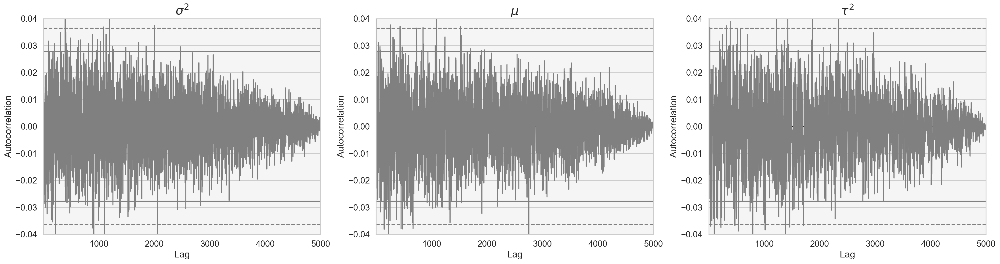

In [9]:
autocorr_SMT(SMT)

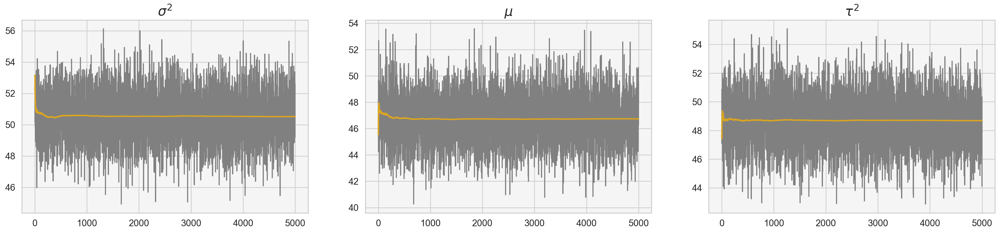

In [10]:
trace_SMT(THETA)

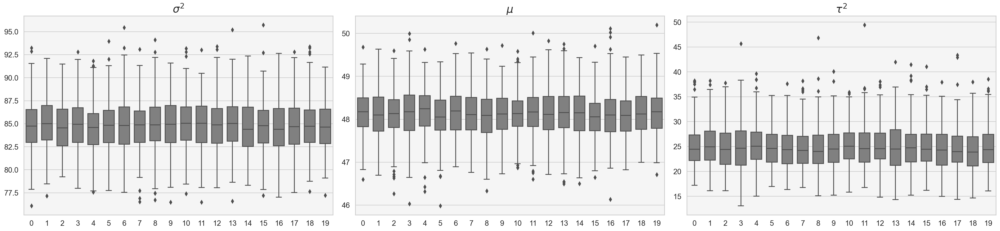

In [11]:
trace_box_SMT(SMT)

### Diagnostic on $\theta$

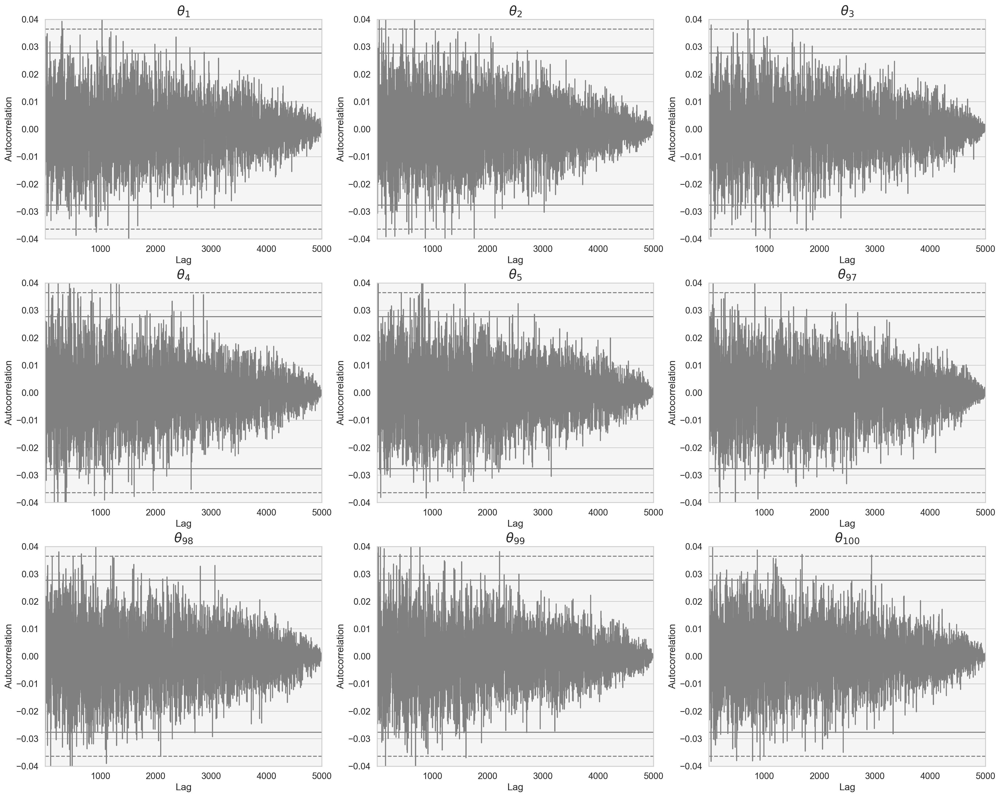

In [12]:
autocorr_THETA(THETA)

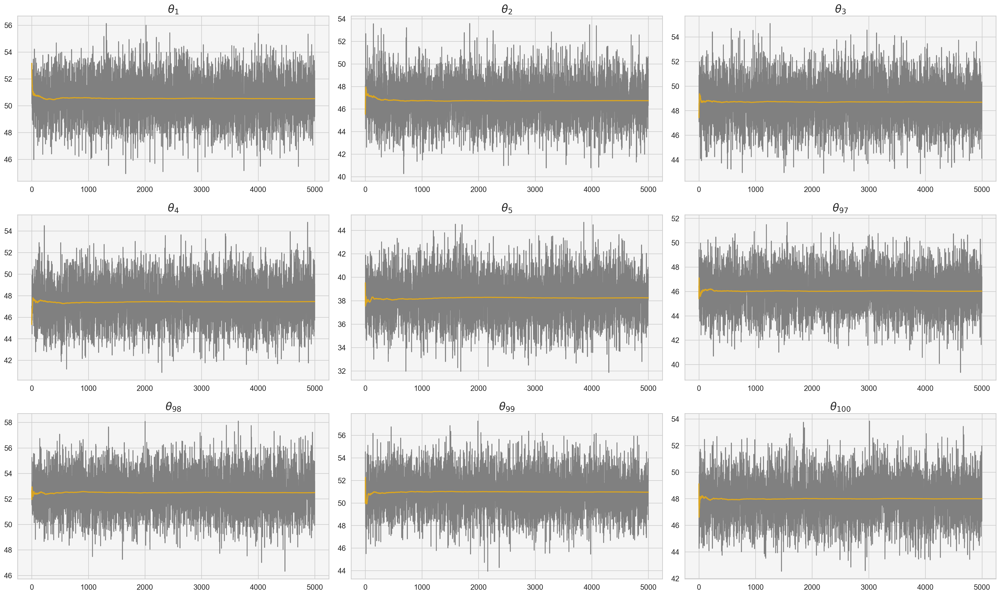

In [13]:
trace_THETA(THETA)

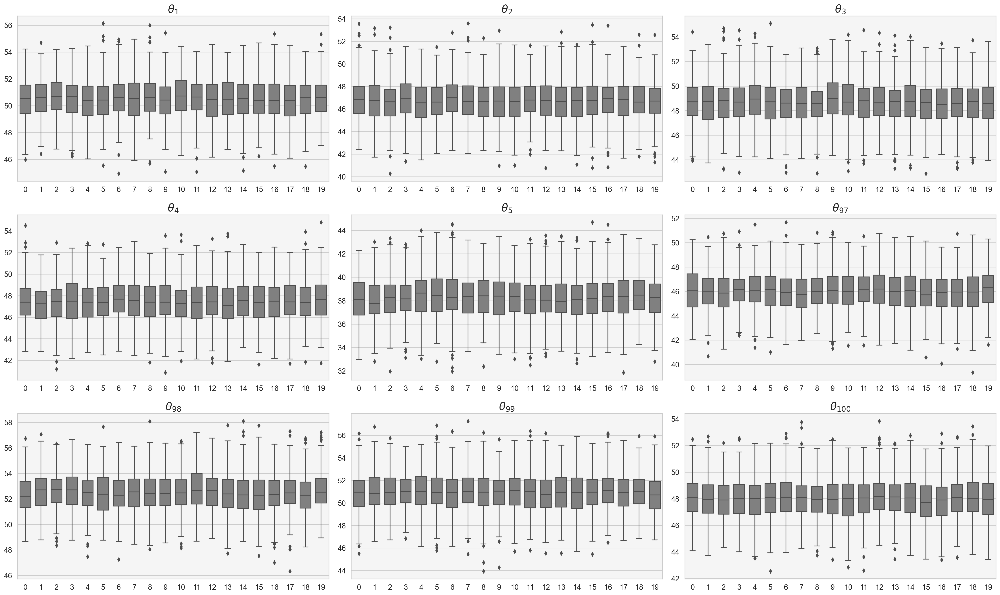

In [14]:
trace_box_THETA(THETA)

## Posterior Densities

### Posterior Densities of $\sigma^2$, $\mu$, $\tau^2$

In [15]:
display(Math(f"Posterior\\ Means: \\theta = {round(mu, 2)}, \\sigma^2 = {round(sigma2, 2)}, \\tau^2 = {round(tau2, 2)}"))

<IPython.core.display.Math object>

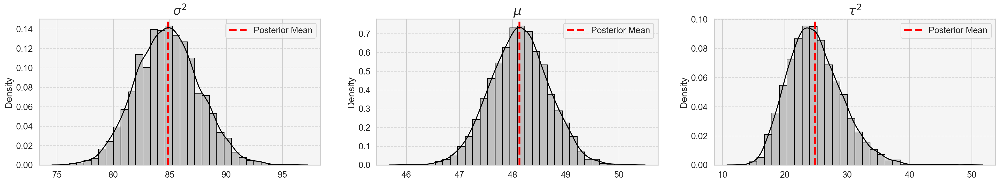

In [16]:
hist_SMT(SMT)

### Posterior Densities of $\theta$

In [17]:
print_probit(np.mean(THETA, axis=0), cf = 'Post. Mean')

   School       Post. Mean
----------------------------
School 1     |   50.5208
School 2     |   46.7373
School 3     |   48.6849
School 4     |   47.4475
School 5     |   38.2394
...          |   ...
School 97    |   46.0207
School 98    |   52.492
School 99    |   50.9555
School 100   |   47.997
----------------------------


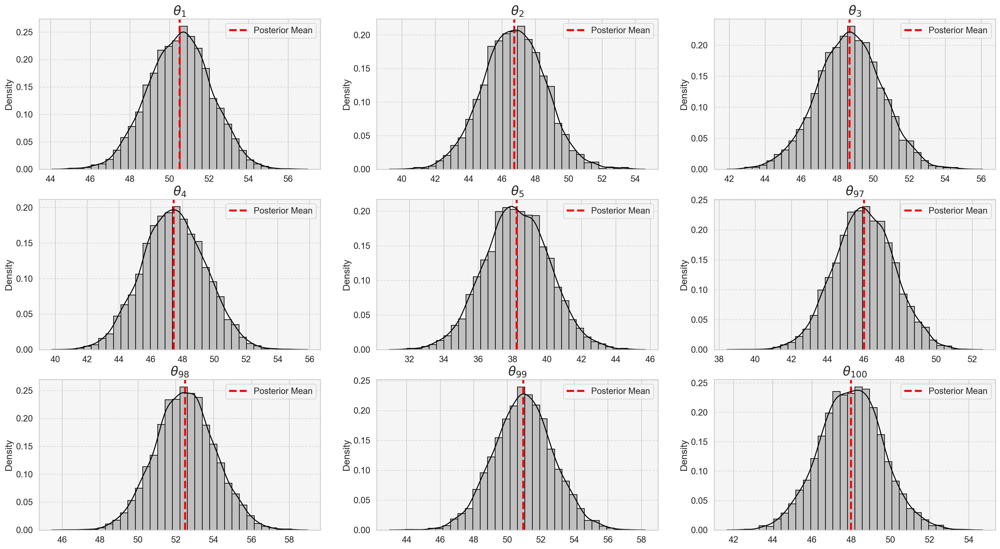

In [18]:
hist_THETA(THETA)

# Part II

### Gibbs Sampling for Hierarchical Normal Regression Model


Hierarchical regression models are a subset of hierarchical models that employ multiple regression techniques to examine the relationship between an independent variable and one or more predictor variables. The key distinction between the hierarchical model discussed in Part I and the hierarchical regression model introduced in the following pages lies in their objectives: the former is tailored for comparing groups, while the latter focuses on analyzing the relationship between a response variable and predictor variables, all while accounting for the nested structure of the data."

### Hierarchical Model Structure
In this context, we will use the following approach:
1.  Ordinary Least Squares (OLS) to describe within-group heterogeneity.
2. A sampling model to capture the group-specific regression parameters.


Thus, we end up with the following Hierarchical Structure:
$$
\mathbf{Y}_j | \boldsymbol{\beta}_j, \sigma^2 \sim N(\mathbf{X}_j \boldsymbol{\beta}_j, \sigma^2 \mathbf{I})
$$
$$
\boldsymbol{\beta}_1, ..., \boldsymbol{\beta}_m \overset{i.i.d}{\sim} N(\boldsymbol{\theta}, \Sigma)
$$
**Note**:
- $\mathbf{Y}_j$ has a multivariate normal distribution of size $m$.
- The group-specific data vectors $\mathbf{Y}_1, \ldots,\mathbf{Y}_m$ being conditionally independent given $\boldsymbol{\beta}_1, ..., \boldsymbol{\beta}_m$ and $\sigma^2$.
- $\mathbf{Y}_j | \boldsymbol{\beta}_j, \sigma^2$ describes the within-group heterogeneity.
-  $\boldsymbol{\beta}_1, ..., \boldsymbol{\beta}_m$ capture the group-specific regression parameters.

The fixed and unknown parameters of these models are $\boldsymbol{\theta}$, $\sigma^2$, and $\Sigma$. 

### Prior Distributions
As suggested by Hoff (2009), I will use semi-conjugate priors for $\boldsymbol{\theta}$ and $\Sigma$, while an inverse-gamma distribution will be used for $\sigma^2$.

Therefore, the prior distributions for the parameters are:

$$
\boldsymbol{\theta} \sim N(\boldsymbol{\mu}_0, \Lambda_0)
$$
$$
\Sigma \sim W^{-1}(\eta_0, \mathbf{S}_0^{-1})
$$
$$
\sigma^2 \sim \Gamma^{-1}\left(\frac{\nu_0}{2}, \frac{\nu_0 \sigma_0^2}{2}\right)
$$



### Full Conditional Distributions
The derivation of the full conditional distribution for this model is quite lenghty, therefore I will just present the final distribution. A detail explanation of the above derivations is available in the full report.
#### Full conditional distribution of $\boldsymbol{\beta}_1, ..., \boldsymbol{\beta}_m$
$$
\boldsymbol{\beta}_j \mid \mathbf{y}_j, \mathbf{X}_j, \boldsymbol{\theta}, \Sigma, \sigma^2 \sim N\left(\left[\Sigma^{-1} + \frac{\mathbf{X}_j^T \mathbf{X}_j}{\sigma^2}\right]^{-1} \left[\Sigma^{-1}\boldsymbol{\theta} + \frac{\mathbf{X}_j^T \mathbf{y}_j}{\sigma^2}\right], \left[\Sigma^{-1} + \frac{\mathbf{X}_j^T \mathbf{X}_j}{\sigma^2}\right]^{-1} \right)
$$

#### Full conditional distribution of $\boldsymbol{\theta}$
$$
\boldsymbol{\theta} \mid \boldsymbol{\beta}_1, ..., \boldsymbol{\beta}_m, \Sigma \sim N(\boldsymbol{\mu_m}, \Lambda_m)
$$
with
$$
\Lambda_m = \left(\Lambda_0^{-1} + m\Sigma^{-1}\right)^{-1}
$$
$$
\boldsymbol{\mu_m} = \Lambda_m\left(\Lambda_0^{-1}\boldsymbol{\mu_0} + m\Sigma^{-1}\bar{\boldsymbol{\beta}}\right)
$$

#### Full conditional distribution of $\Sigma$
$$
\Sigma \mid \boldsymbol{\theta}, \boldsymbol{\beta}_1, ..., \boldsymbol{\beta}_m \sim W^{-1}\left(\eta_0 + m, \left[\mathbf{S_0} + \mathbf{S_{\theta}}\right]^{-1}\right)
$$
with
$$
\mathbf{S_{\theta}} = \sum_{j=1}^m (\boldsymbol{\beta_j} - \boldsymbol{\theta})(\boldsymbol{\beta_j} - \boldsymbol{\theta})^T
$$


#### Full conditional distribution of $\sigma^2$
$$
\sigma^2 \sim \Gamma^{-1}\left(\frac{\nu_0 + \sum n_j}{2}, \frac{\nu_0 \sigma_0^2 + \text{SSR}}{2}\right), \text{ where}
$$

$$
\text{SSR} = \sum_{j=1}^{m} \sum_{i=1}^{n_j} (y_{i,j} - \boldsymbol{\beta_j}^T \mathbf{x}_{i,j})^2.
$$

The starting values will be specified according to the suggestion made by Hoff (2009).

Therefore, I will set:

- $(\mu_0, \Lambda_0) = (\text{AVG}(\text{OLS Regressors}), \text{SampleVariance}(\text{OLS Regressors}))$
- $(\eta_0, \mathbf{S_0}^{-1}) = (p + 2, \text{COV}(\text{OLS Regressors}))$
- $(\mu_0, \gamma_0^2) = (1, \text{AVG}(\text{Within Group Sample Variance}))$

Therefore, we will end up with a prior on $\theta$ that is weak and unbiased, and a prior on $\Sigma$ that is diffuse but with an expectation equal to the sample covariance of the OLS regressors.

**Bibliography**

Hoff, P. D. (2009). *A First Course in Bayesian Statistical Methods*. Springer Publishing Company, Incorporated. ISBN: 0387922997.

### Loading the data

In [19]:
#Loading the data
score_cov = pd.read_csv("/Users/lemon/Documents/Uni/Magistrale/Semestre 1/Statistics/Computational Statistics/Final Project/CSV files/Scores_with_covariates.csv",sep = ';')
score_cov.head()

,sch_id,sch_freelunch,stu_ses,stu_mathscore
0,1011,6,-0.059948,52.11
1,1011,6,1.051652,57.65
2,1011,6,-0.863515,66.44
3,1011,6,-0.796551,44.68
4,1011,6,-1.613511,40.57


In [20]:
#Separing the data in target and predictor
columns_to_keep = ['sch_id','sch_freelunch', 'stu_ses']
X = score_cov.loc[:, columns_to_keep]
Y = score_cov.loc[:, ['sch_id','stu_mathscore']]

In [21]:
#Data Hanlding: managing the cross sectional nature of the data
import numpy as np

# Load data file
nels = pd.read_csv("/Users/lemon/Documents/Uni/Magistrale/Semestre 1/Statistics/Computational Statistics/Final Project/CSV files/Scores_with_covariates.csv",sep = ';')

# Create a sorted list of unique values of the "sch_id" column
ids = np.sort(np.unique(nels['sch_id']))
m = len(ids)

# Initialize numpy arrays for Y, X, and N
Y = np.empty(m, dtype=object)
X = np.empty(m, dtype=object)
N = np.empty(m)

# Loop through each id
for j in range(m):
    # Extract the Y and N values for the current id
    Y[j] = nels[nels['sch_id'] == ids[j]]['stu_mathscore'].values
    N[j] = nels[nels['sch_id'] == ids[j]].shape[0]
    # Extract the xj values for the current id
    x_ses = nels[nels['sch_id'] == ids[j]]['stu_ses'].values
    x_lunch = xj = nels[nels['sch_id'] == ids[j]]['sch_freelunch'].values
    #xj = (xj - xj.mean())
    # Create the X matrix for the current id
    X[j] = np.column_stack((np.ones(int(N[j])),x_lunch,  x_ses))


## Gibbs Sampling Algorithm for Hierarchical Normal Regression Models

### OLS Estimation (Necessary to set up the initial parameters)

In [22]:
## Fitting OLS model to the data
import statsmodels.api as sm

# Initialize empty arrays for BETA_LS and S2_LS
BETA_LS = np.empty((m,3))
S2_LS = np.empty(m)

for j in range(m):
    # Fit the OLS model
    fit = sm.OLS(Y[j], X[j]).fit()
    # Extract coefficients and add them to BETA_LS
    BETA_LS[j,:] = fit.params
    # Extract the residual variance and add it to S2_LS
    S2_LS[j] = fit.mse_resid

### Gibbs Sampling Algorithm

In [23]:
import numpy as np
from scipy.stats import wishart, norm

def rmvnorm(n, mu, Sigma):
    E = np.random.normal(size=(n, len(mu)))
    return E @ np.linalg.cholesky(Sigma) + mu

def rwish(n, nu0, S0):
    sS0 = np.linalg.cholesky(S0)
    S = np.zeros((S0.shape[0], S0.shape[1], n))
    for i in range(n):
        Z = np.random.normal(size=(nu0, S0.shape[1])) @ sS0
        S[:, :, i] = Z.T @ Z
    return S

p = X[0].shape[1]
theta = mu0 = np.mean(BETA_LS, axis=0)
nu0 = 1
s2 = s20 = np.mean(S2_LS)
eta0 = p + 2
Sigma = S0 = L0 = np.cov(BETA_LS.T)
BETA = BETA_LS
THETA_b = []
S2_b = []
iL0 = np.linalg.inv(L0)
iSigma = np.linalg.inv(Sigma)
Sigma_ps = []
SIGMA_PS = None
BETA_ps = []
BETA_pp = None

num_steps = 10000

np.random.seed(1)
for s in range(1, num_steps):
    
    ## Update beta_j 
    for j in range(m):
        Vj = np.linalg.inv(iSigma + np.dot(X[j].T, X[j])/s2)
        Ej = np.dot(Vj, (np.dot(iSigma, theta) + np.dot(X[j].T, Y[j])/s2))
        # Ensure Vj is symmetric
        Vj = (Vj + Vj.T) / 2
        # Regularize Vj to make it positive definite
        epsilon = 1e-6
        Vj += epsilon * np.eye(Vj.shape[0])
        # Sample BETA[j]
        BETA[j] = np.random.multivariate_normal(mean=Ej, cov=Vj)
        
    ##
    ##update theta
    Lm = np.linalg.inv(iL0 + m*iSigma)
    # Ensure Lm is symmetric
    Lm = (Lm + Lm.T) / 2
    # Regularize Lm to make it positive definite
    Lm += epsilon * np.eye(Lm.shape[0])

    mum = np.dot(Lm, (np.dot(iL0,mu0) +  np.dot(iSigma,BETA.sum(axis=0))))
    # Sample theta
    theta = np.random.multivariate_normal(mean=mum, cov=Lm)

    
    ##
    ##update Sigma
    mtheta = np.matrix(theta)
    iSigma = wishart.rvs(eta0+m, np.linalg.inv(S0 + np.dot((BETA-mtheta).T, BETA-mtheta)))

    
    ##
    ##update s2
    RSS = 0
    for j in range(m):
        RSS += sum((Y[j]-np.dot(X[j], BETA[j]))**2)
    rate = (nu0*s20+RSS) / 2
    s2 = 1/gamma.rvs(a = (nu0+sum(N))/2, scale = 1/rate)

    
    ##
    ##store results
    if s%10==0: 
        S2_b.append(s2)
        THETA_b += [theta]
        Sigma_ps += [np.linalg.inv(iSigma)]
        BETA_ps += [BETA.copy()]
        
    if s % 1000 == 0:
        print(f'Iteration {s}')
    if s == num_steps-1:
        print('Completed')

THETA_b = np.array(THETA_b)
BETA_ps = np.array(BETA_ps)
Sigma_ps = np.array(Sigma_ps)

Iteration 1000
Iteration 2000
Iteration 3000
Iteration 4000
Iteration 5000
Iteration 6000
Iteration 7000
Iteration 8000
Iteration 9000
Completed


## Markov Chain Diagnostic: Trace Plots and Autocorrelation Functions

### Diagnostic on $\boldsymbol{\theta}$

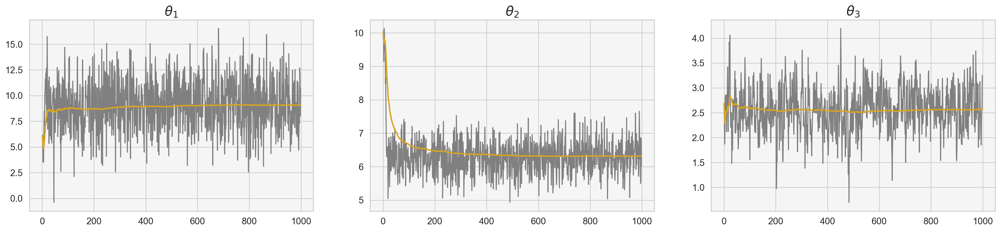

In [24]:
trace_THETA_II(THETA_b)

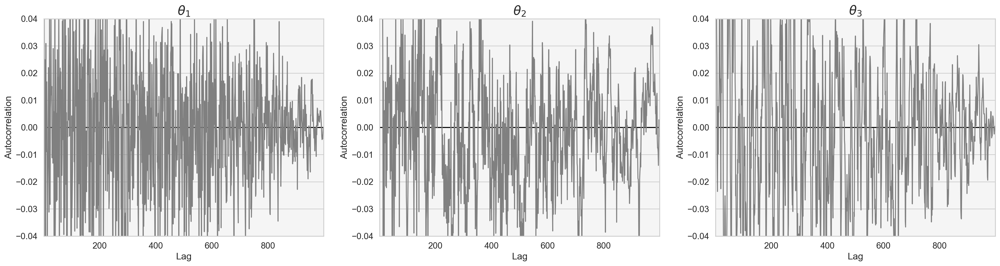

In [25]:
autocorr_THETA_II(THETA_b)

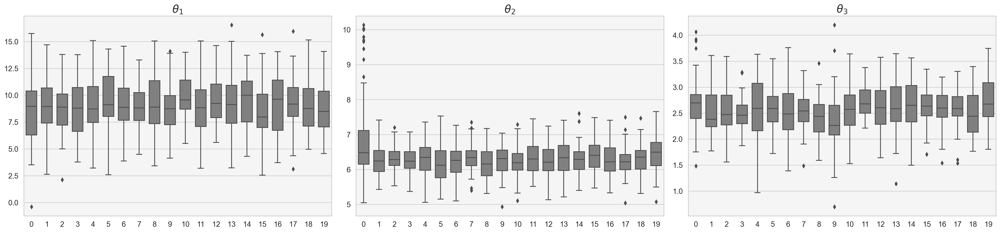

In [26]:
trace_box_THETA_II(THETA_b)

### Diagnostic on $\sigma^2$

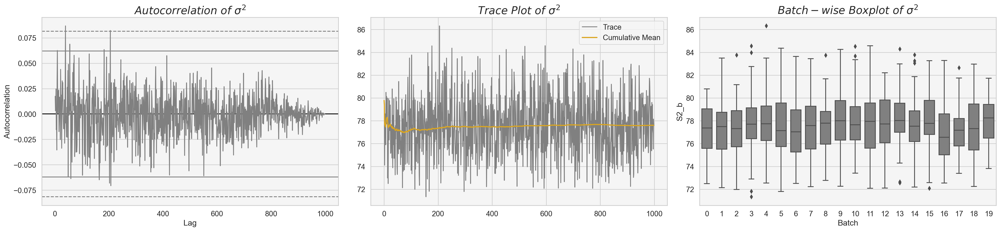

In [27]:
plot_S2_b(S2_b, n_batches=20)

### Diagnostic on $\beta_k$ for scools (1,...,9)

In [28]:
# Getting out a specific coefficient for each school
k = 2
beta_chains_dict = get_beta_school(BETA_ps, coeff = k)

<IPython.core.display.Math object>

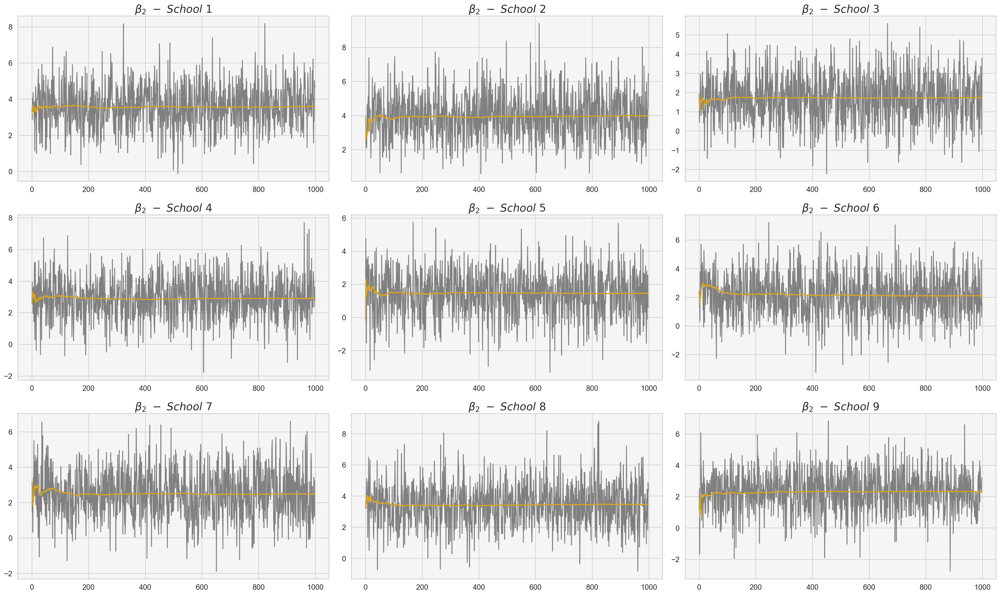

In [29]:
trace_BETA(beta_chains_dict)

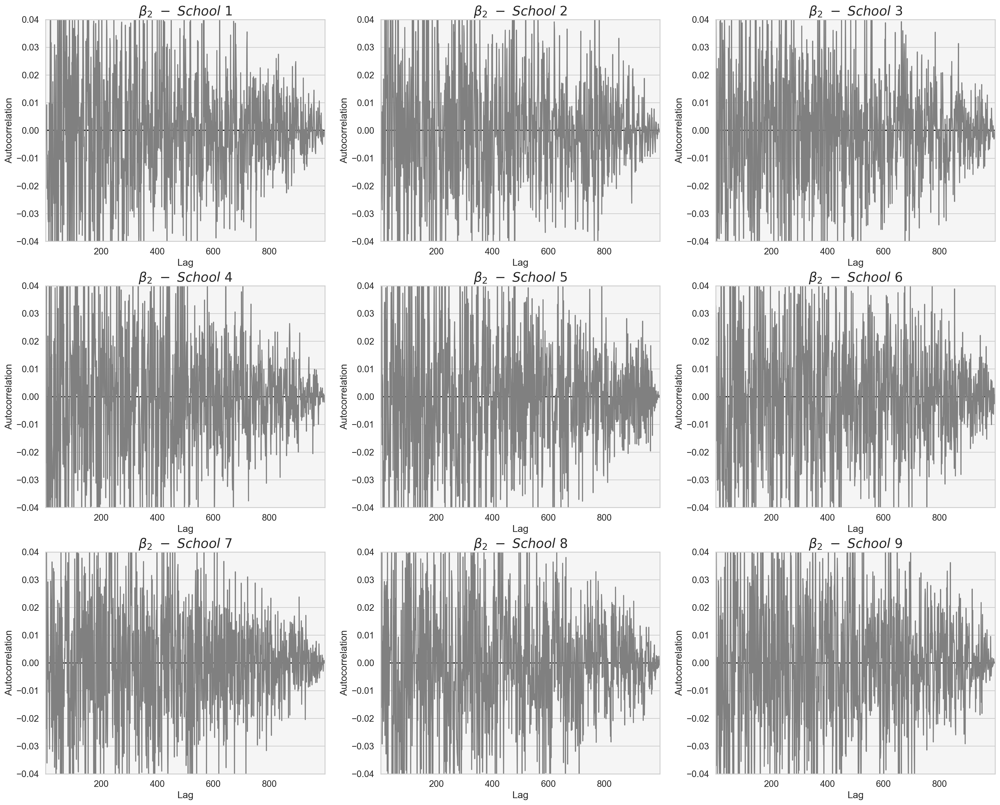

In [30]:
autocorr_BETA(beta_chains_dict)

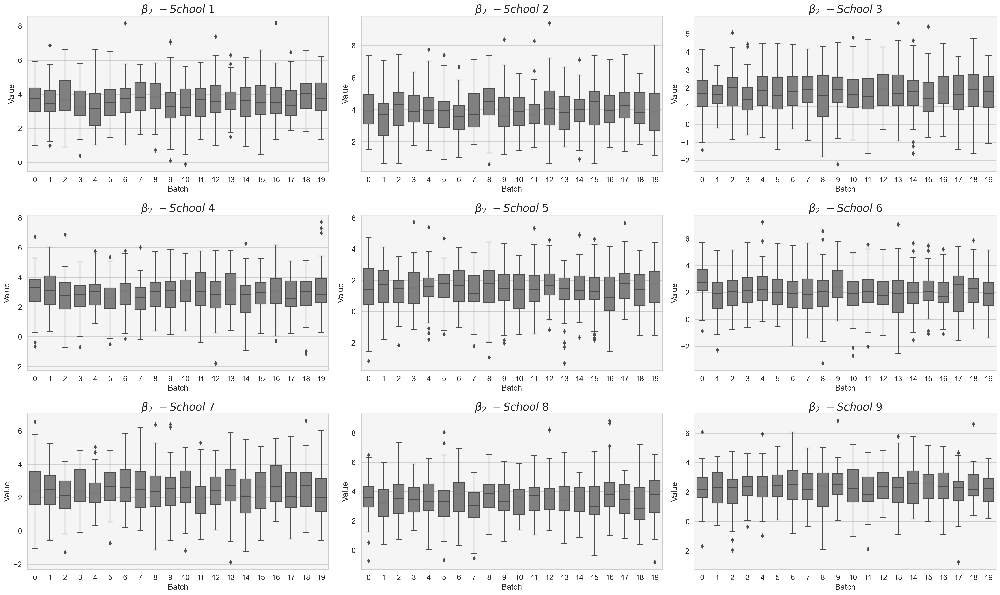

In [31]:
trace_box_BETA(beta_chains_dict, n_batches = 20)

## Posterior Densities

### Posterior Densities of $\boldsymbol{\theta}$

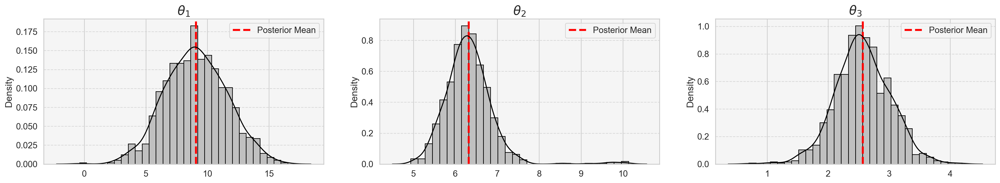

In [32]:
hist_THETA_II(THETA_b)

### Posterior Densities of $\sigma^2$

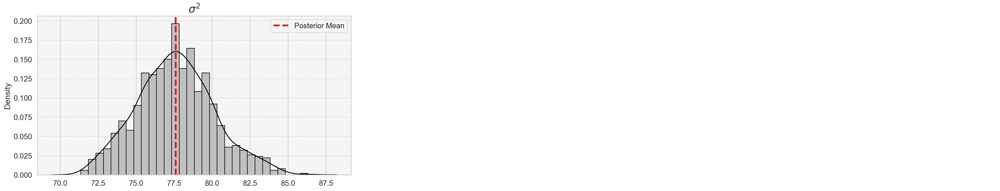

In [33]:
hist_S2_b(S2_b)

### Posterior Densities of $\beta_k$ for scools (1,...,9)

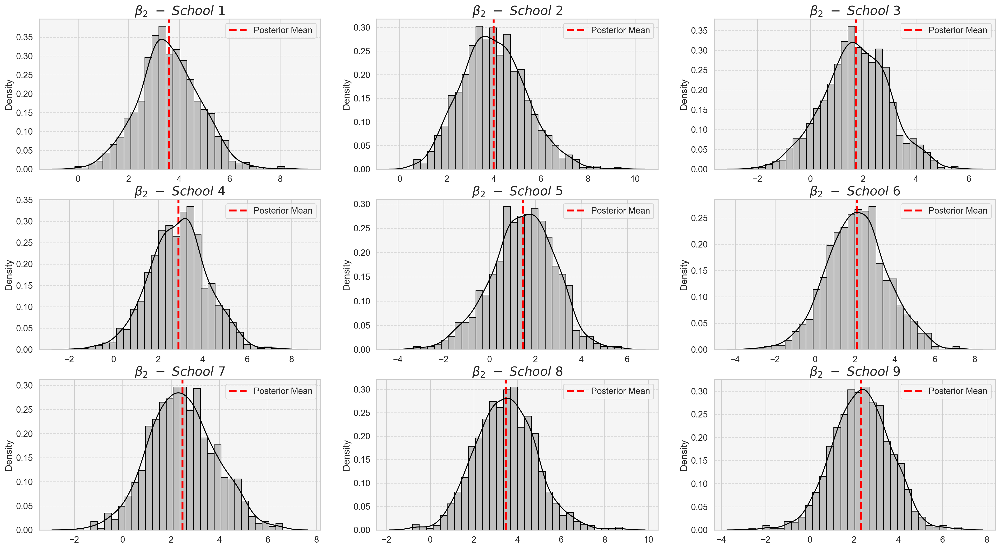

In [34]:
hist_BETA(beta_chains_dict)